# Poincare Boundary Condition Aug Lag

Most of the tutorials use last closed flux surface (LCFS) as the boundary condition for 3D equilibrium. This tutorial will cover another way to define boundary condition using DESC.

In [1]:
import sys
import os

sys.path.insert(0, os.path.abspath("."))
sys.path.append(os.path.abspath("../../../"))

If you have access to a GPU, uncomment the following two lines. 

In [2]:
from desc import set_device
set_device("gpu")

As mentioned in [DESC Documentation on performance tips](https://desc-docs.readthedocs.io/en/latest/performance_tips.html), one can use compilation cache directory to reduce the compilation overhead time. Note: One needs to create `jax-caches` folder manually.

In [3]:
# import jax

# jax.config.update("jax_compilation_cache_dir", "../jax-caches")
# jax.config.update("jax_persistent_cache_min_entry_size_bytes", -1)
# jax.config.update("jax_persistent_cache_min_compile_time_secs", 0)

In [4]:
%matplotlib inline
import numpy as np

from desc.io import load
from desc.equilibrium import EquilibriaFamily, Equilibrium
from desc.continuation import solve_continuation_automatic
from desc.optimize import Optimizer
from desc.grid import LinearGrid
from desc.objectives import (
    ObjectiveFunction,
    ForceBalance,
    FixCurrent,
    FixSectionLambda,
    FixSectionR,
    FixSectionZ,
    FixBoundaryR,
    FixBoundaryZ,
    FixPressure,
    FixPsi,
    FixIota,
    QuasisymmetryTwoTerm,
    AspectRatio,
    Elongation,
    Volume,
    RotationalTransform,
    get_fixed_xsection_constraints,
    get_fixed_boundary_constraints,
)
from desc.examples import get
from desc.plotting import *
from desc.geometry import ZernikeRZToroidalSection, FourierRZToroidalSurface
from desc.backend import print_backend_info
from desc.compat import rotate_zeta

import plotly.express as px
import plotly.io as pio

# This ensures Plotly output works in multiple places:
# plotly_mimetype: VS Code notebook UI
# notebook: "Jupyter: Export to HTML" command in VS Code
# See https://plotly.com/python/renderers/#multiple-renderers
pio.renderers.default = "plotly_mimetype+notebook"

print_backend_info()

DESC version=0.16.0+431.g27a83e1ba.
Using JAX backend: jax version=0.6.2, jaxlib version=0.6.2, dtype=float64.
Using device: NVIDIA GeForce RTX 4080 Laptop GPU (id=0), with 10.56 GB available memory.


## Optimization with Poincare Solve

During equilibrium optimization, if a user gives `ForceBalance` as constraint, DESC automatically uses `proximal-lsq-exact` which solve the equilibrium at each optimization step to preserve the MHD force balance. This internal equilibrium solve use fixed-boundary constraint by default. However, this can be changed to fixed-Poincare section solve, if user adds one of the `FixSection...` constraints instead of `FixBoundary...` constraints. Let's see an example!

We will conduct a similar optimization as shown in `desc.examples.precise_QH.py`.

In [5]:
def set_poincare_equilibrium(eq):
    eq_poincare = Equilibrium(
        xsection=eq.get_surface_at(zeta=0),
        pressure=eq.pressure,
        iota=eq.iota,
        Psi=eq.Psi,  # flux (in Webers) within the last closed flux surface
        NFP=eq.NFP,  # number of field periods
        L=eq.L,  # radial spectral resolution
        M=eq.M,  # poloidal spectral resolution
        N=eq.N,  # toroidal spectral resolution
        L_grid=eq.L_grid,  # real space radial resolution, slightly oversampled
        M_grid=eq.M_grid,  # real space poloidal resolution, slightly oversampled
        N_grid=eq.N_grid,  # real space toroidal resolution
        sym=eq.sym,  # explicitly enforce stellarator symmetry
        spectral_indexing=eq._spectral_indexing,
    )

    eq_poincare.change_resolution(eq.L, eq.M, eq.N)
    eq_poincare.axis = eq_poincare.get_axis()
    eq_poincare.surface = eq_poincare.get_surface_at(rho=1)
    return eq_poincare

In [6]:
try:
    eq = load("poincare_precise_QA_initial_eq_0.h5")
    eq.xsection = eq.get_surface_at(zeta=0)
    eq.surface = eq.get_surface_at(rho=1)
    raise FileNotFoundError()
except FileNotFoundError:
    eq = load("../../../desc/examples/precise_QA_output.h5")[0]
    eq.xsection = eq.get_surface_at(zeta=0)
    eq.surface = eq.get_surface_at(rho=1)
    constraints = get_fixed_xsection_constraints(eq=eq, fix_lambda=True)
    objective = ObjectiveFunction(ForceBalance(eq))

    # before optimization make sure that the initial equilibrium
    # is in force balance in terms of poincare constraints
    eq.solve(
        verbose=3,
        objective=objective,
        constraints=constraints,
        maxiter=1000,
        ftol=1e-3,
    );
    eq.xsection = eq.get_surface_at(zeta=0)
    eq.surface = eq.get_surface_at(rho=1)
    eq.save("poincare_precise_QA_initial_eq_using_v16_updated.h5")

Building objective: force
Precomputing transforms
Timer: Precomputing transforms = 722 ms
Timer: Objective build = 1.24 sec
Building objective: fixed cross-section R
Building objective: fixed cross-section Z
Building objective: fixed cross-section λ
Building objective: fixed Psi
Building objective: fixed pressure
Building objective: fixed current
Building objective: fixed sheet current
Building objective: lambda gauge
Building objective: self_consistency axis R
Building objective: self_consistency axis Z
Building objective: self_consistency section R
Building objective: self_consistency section Z
Building objective: self_consistency section λ
Timer: Objective build = 448 ms
Timer: LinearConstraintProjection build = 4.98 sec
Number of parameters: 1080
Number of objectives: 5346
Timer: Initializing the optimization = 6.89 sec

Starting optimization
Using method: lsq-exact
Solver options:
------------------------------------------------------------
Maximum Function Evaluations       : 500

In [7]:
eqfam = EquilibriaFamily(eq)
eq00 = get("precise_QA")
V = eq.compute("V")["V"]
Vorg = eq00.compute("V")["V"]

# grid for computing quasisymmetry objective
grid = LinearGrid(M=eq.M, N=eq.N, NFP=eq.NFP, rho=np.array([0.6, 0.8, 1.0]), sym=True)

In [8]:
from desc.objectives.normalization import compute_scaling_factors
compute_scaling_factors(eq)

{'R0': Array(1., dtype=float64),
 'a': np.float64(0.16600000000000004),
 'Psi': Array(0.087, dtype=float64),
 'A': np.float64(0.08656972716232038),
 'V': Array(0.54393364, dtype=float64),
 'B': Array(1.25621281, dtype=float64),
 'I': Array(1042656.63033306, dtype=float64),
 'W': Array(341532.85707446, dtype=float64),
 'J': Array(6022062.58764138, dtype=float64),
 'F': Array(3782496.07497346, dtype=float64),
 'f': Array(2057426.84984614, dtype=float64),
 'p': Array(627894.34844559, dtype=float64),
 'W_p': Array(170766.42853723, dtype=float64)}

In [9]:
print(f"Initial volume: {V:.6f}, Volume of precise QA: {Vorg:.6f}")

Initial volume: 0.543934, Volume of precise QA: 0.600325


In [24]:
w_qs = 1
# w_ar = 1
# w_vol = 50
# w_iota = 20

def run_step(n, eqfam, ftol=1e-2, **kwargs):
    objective = ObjectiveFunction(
        (
            QuasisymmetryTwoTerm(
                eq=eqfam[-1],
                helicity=(1, 0),
                grid=grid,
                normalize=False,
                weight=w_qs,
            )
        ),
    )
    # modes to fix
    bc_surf = eqfam[-1].xsection
    R_modes = bc_surf.R_basis.modes[np.max(np.abs(bc_surf.R_basis.modes), 1) > n, :]
    Z_modes = bc_surf.Z_basis.modes[np.max(np.abs(bc_surf.Z_basis.modes), 1) > n, :]
    constraints = (
        ForceBalance(eq=eqfam[-1]),
        AspectRatio(eq=eqfam[-1], target=6),
        Volume(eq=eqfam[-1], target=Vorg),
        RotationalTransform(eq=eqfam[-1], target=0.42),
        FixSectionR(eq=eqfam[-1], modes=R_modes),
        FixSectionZ(eq=eqfam[-1], modes=Z_modes),
        FixPressure(eq=eqfam[-1]),
        FixCurrent(eq=eqfam[-1]),
        FixPsi(eq=eqfam[-1]),
    )

    optimizer = Optimizer("lsq-auglag")
    eq_new, _ = eqfam[-1].optimize(
        objective=objective,
        constraints=constraints,
        optimizer=optimizer,
        maxiter=250,
        verbose=3,
        ftol=ftol,
        copy=True,
        # options={
        #     "perturb_options": {"verbose": 0},
        #     "solve_options": {"verbose": 0, "ftol": 1e-3, "maxiter": 250},
        #     **kwargs,
        # },
    )
    # to make sure the surfaces are updated properly
    eq_new.xsection = eq_new.get_surface_at(zeta=0)
    eq_new.surface = eq_new.get_surface_at(rho=1)
    eqfam.append(eq_new)
    return eqfam

Building objective: QS two-term
Precomputing transforms
Timer: Precomputing transforms = 60.5 ms
Timer: Objective build = 64.4 ms
Building objective: fixed cross-section R
Building objective: fixed cross-section Z
Building objective: fixed pressure
Building objective: fixed current
Building objective: fixed Psi
Building objective: lambda gauge
Building objective: self_consistency axis R
Building objective: self_consistency axis Z
Building objective: self_consistency section R
Building objective: self_consistency section Z
Building objective: self_consistency section λ
Timer: Objective build = 160 ms
Building objective: force
Precomputing transforms
Timer: Precomputing transforms = 69.7 ms
Building objective: aspect ratio
Precomputing transforms
Timer: Precomputing transforms = 28.6 ms
Building objective: volume
Precomputing transforms
Timer: Precomputing transforms = 28.4 ms
Building objective: rotational transform
Precomputing transforms
Timer: Precomputing transforms = 32.7 ms
Timer:

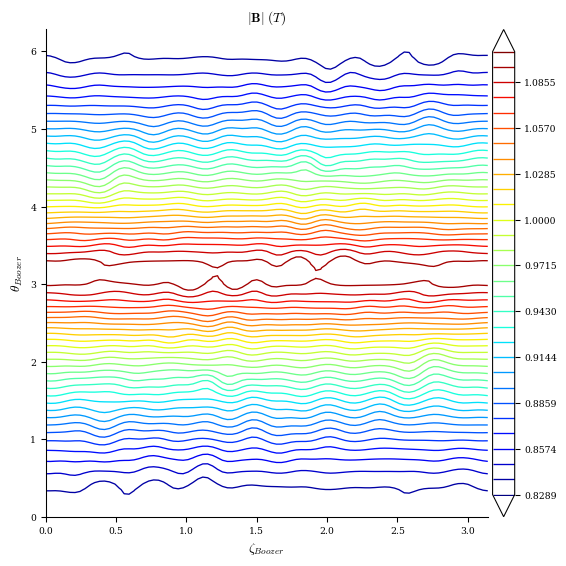

In [25]:
eqfam = run_step(8, eqfam, ftol=1e-3)
plot_boozer_surface(eqfam[-1]);

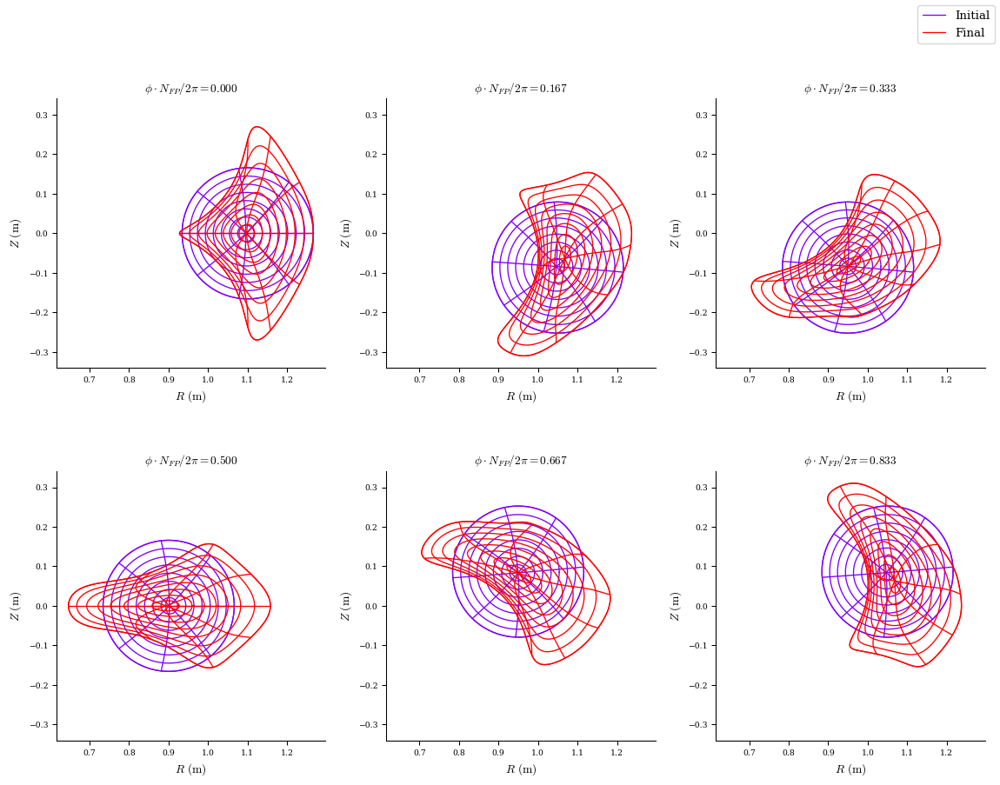

In [26]:
plot_comparison(eqs=[eqfam[0], eqfam[-1]], labels=["Initial", "Final"]);

In [27]:
plot_3d(eqfam[-1], "|B|")

/CODES/DESC/desc/utils.py:572: UserWarning:

Unequal number of field periods for grid 1 and basis 2.

/CODES/DESC/desc/utils.py:572: UserWarning:

Unequal number of field periods for grid 1 and basis 2.



(<Figure size 384.076x384.076 with 1 Axes>,
 <Axes: xlabel='$\\rho$', ylabel='$ \\iota ~(~)$'>)

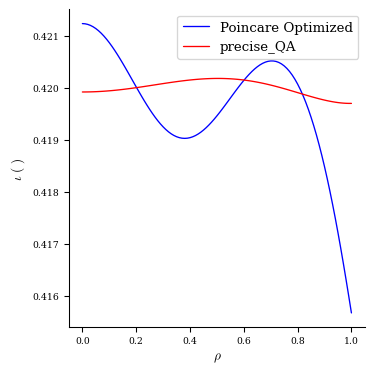

In [28]:
eq00 = get("precise_QA")
fig, ax = plot_1d(eqfam[-1], "iota", label="Poincare Optimized", color="blue")
plot_1d(eq00, "iota", ax=ax, label="precise_QA", color="red")

In [29]:
fig = plot_3d(eqfam[-1], "|B|")
plot_3d(eq00, "|B|", fig=fig)

/CODES/DESC/desc/utils.py:572: UserWarning:

Unequal number of field periods for grid 1 and basis 2.

/CODES/DESC/desc/utils.py:572: UserWarning:

Unequal number of field periods for grid 1 and basis 2.

/CODES/DESC/desc/utils.py:572: UserWarning:

Unequal number of field periods for grid 1 and basis 2.

/CODES/DESC/desc/utils.py:572: UserWarning:

Unequal number of field periods for grid 1 and basis 2.



In [30]:
eq_rotated = eqfam[-1].copy()
eq_rotated = rotate_zeta(eq_rotated, np.pi / 2)
fig = plot_3d(eq_rotated, "|B|")
plot_3d(eq00, "|B|", fig=fig, alpha=0.3)

/CODES/DESC/desc/utils.py:572: UserWarning:

Unequal number of field periods for grid 1 and basis 2.

/CODES/DESC/desc/utils.py:572: UserWarning:

Unequal number of field periods for grid 1 and basis 2.

/CODES/DESC/desc/utils.py:572: UserWarning:

Unequal number of field periods for grid 1 and basis 2.

/CODES/DESC/desc/utils.py:572: UserWarning:

Unequal number of field periods for grid 1 and basis 2.



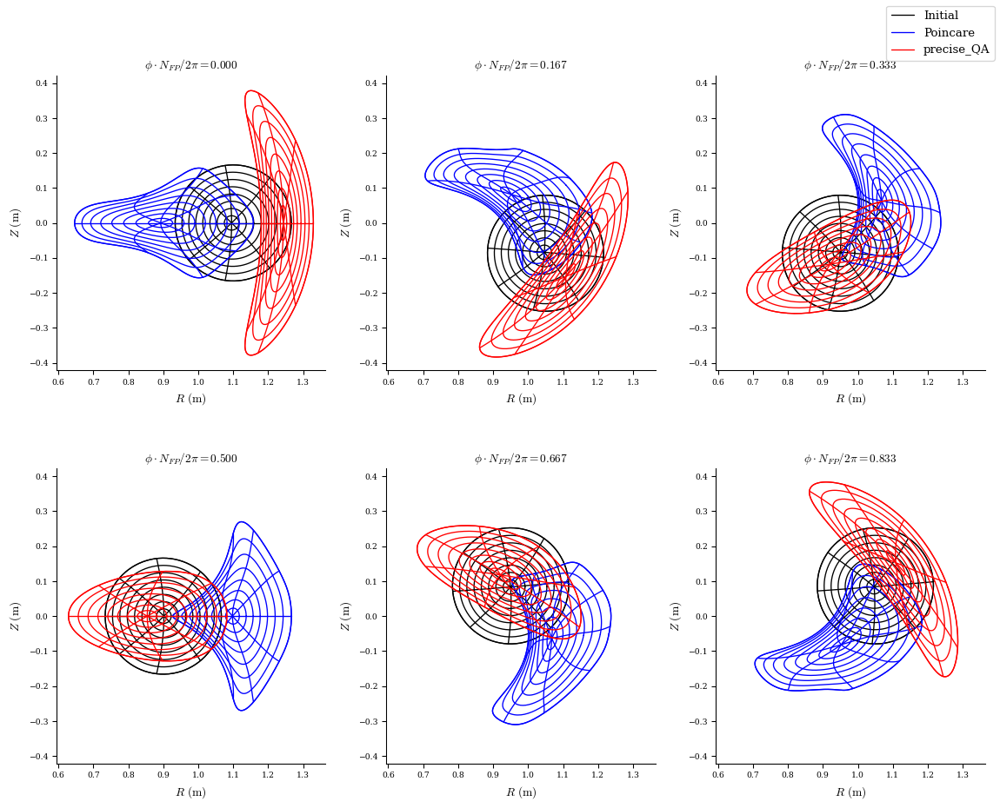

In [31]:
plot_comparison(
    eqs=[eqfam[0], eq_rotated, eq00],
    labels=["Initial", "Poincare", "precise_QA"],
    color=["black", "blue", "red"],
);

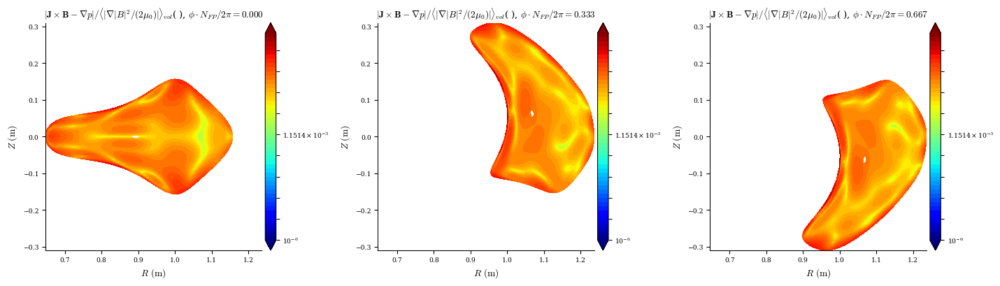

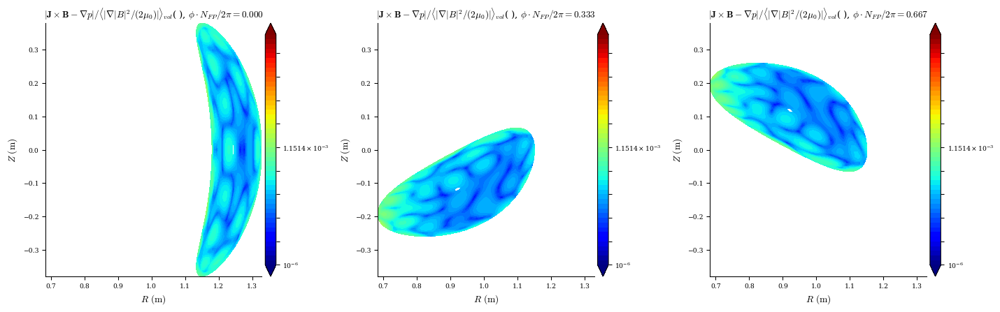

In [32]:
levels = np.logspace(-6, 0, 50)
plot_section(eq_rotated, "|F|_normalized", log=True, phi=3, levels=levels)
plot_section(eq00, "|F|_normalized", log=True, phi=3, levels=levels);

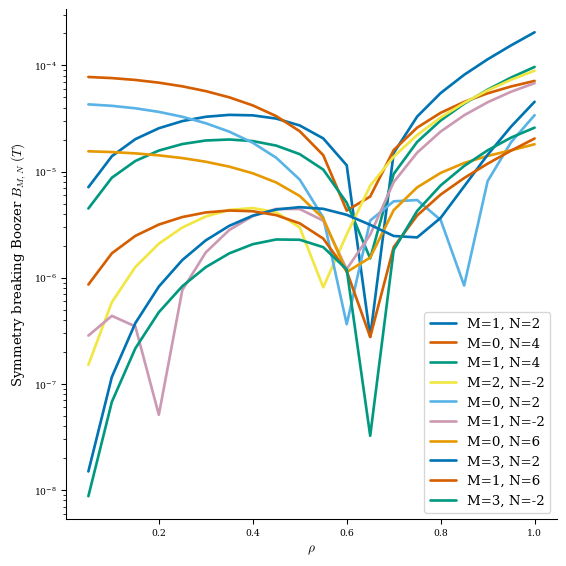

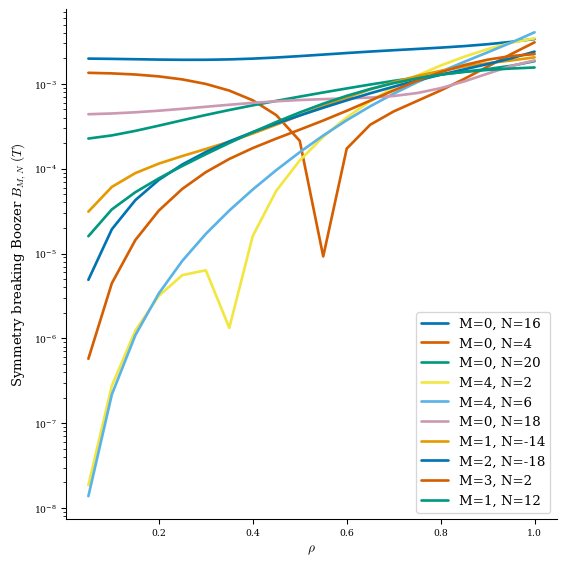

In [23]:
plot_boozer_modes(eq00, helicity=(1, 0))
plot_boozer_modes(eqfam[-1], helicity=(1, 0));

In [ ]:
plot_section(eq00, "lambda");
plot_1d(eq00, "lambda");